<a href="https://colab.research.google.com/github/scjjb/MIDOG_Domain_Adaptation/blob/main/Domain_Adaptation_Examples.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Prepare notebook with relevant packages

In [1]:
!git clone https://github.com/scjjb/MIDOG_Domain_Adaptation

!pip install -U object-detection-fastai
!sudo apt-get install openslide-tools
!sudo apt-get install python-openslide
!pip install openslide-python

## Macenko Normalisation Package
!git clone https://github.com/schaugf/HEnorm_python



Cloning into 'MIDOG_Domain_Adaptation'...
remote: Enumerating objects: 66, done.
remote: Counting objects: 100% (66/66), done.
remote: Compressing objects: 100% (62/62), done.
remote: Total 66 (delta 17), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (66/66), done.
     |████████████████████████████████| 316 kB 13.2 MB/s 
     |████████████████████████████████| 60.3 MB 80 kB/s 
  Created wheel for openslide-python: filename=openslide_python-1.1.2-cp37-cp37m-linux_x86_64.whl size=27697 sha256=1ca365e018d8742c8cdb679d091677b3e49761027fdb109c6c8df28e034c8585
  Stored in directory: /root/.cache/pip/wheels/6f/c3/97/980962653f9305314bfb6d93f80be5e21f13e206af66fc7ad3
Successfully built openslide-python
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.1.2.30
    Uninstalling opencv-python-4.1.2.30:
      Successfully uninstalled opencv-python-4.1.2.30
ERROR: pip's dependency resolver does not currently take into account all the packages that ar

In [2]:
from MIDOG_Domain_Adaptation.code.data_funcs import get_bbox_df,train_test_split
from MIDOG_Domain_Adaptation.code.segmentation_processing import preprocess_crops
from MIDOG_Domain_Adaptation.code.neural_style_transfer_processing import preprocess, deprocess
from MIDOG_Domain_Adaptation.code.neural_style_transfer_modelling import style_transfer

from google.colab import drive
import matplotlib.pyplot as plt
import PIL
import numpy as np
import torch
from torchvision import models
import os
from HEnorm_python.normalizeStaining import normalizeStaining
from tqdm import tqdm_notebook as tqdm

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu") 
print(device)

vgg = models.vgg19(pretrained = True).features ##removes classifier
for parameters in vgg.parameters():
  parameters.requires_grad_(False)
vgg.to(device)

cuda


Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


  0%|          | 0.00/548M [00:00<?, ?B/s]

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

In [4]:
## Mount google drive if using this for data storage
drive.mount('/drive')

Mounted at /drive


## View Domain Adaptations and Macenko Normalisation

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if sys.path[0] == '':


  0%|          | 0/20 [00:00<?, ?it/s]

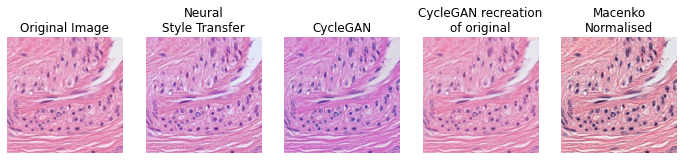

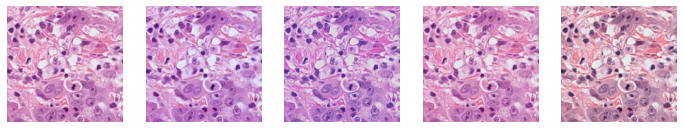

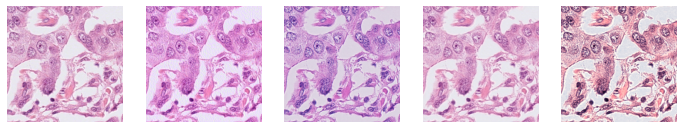

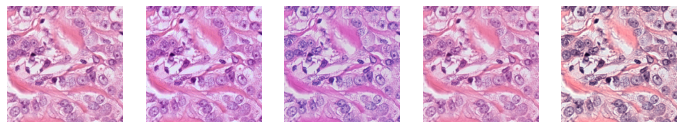

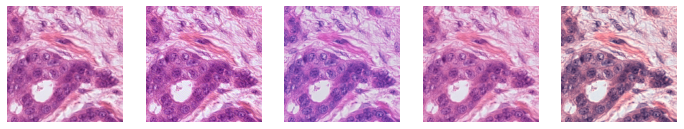

...

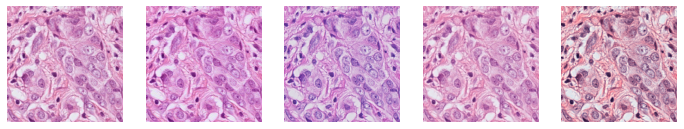

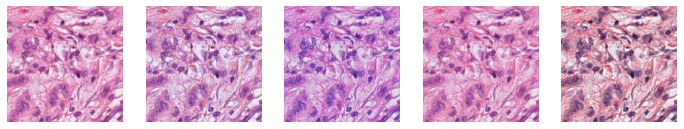

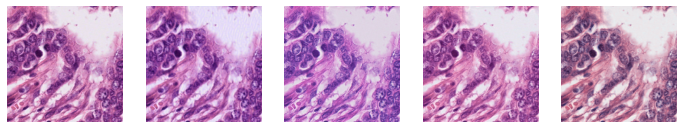

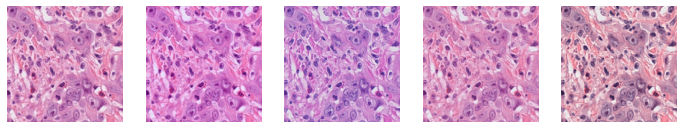

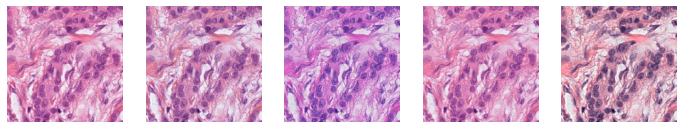

In [5]:
## Model 1

train_scanners = ["Hamamatsu S360"]
valid_scanners=["Hamamatsu XR"] 
train_names=("").join([name[-2:] for name in train_scanners])
valid_names=("").join([name[-2:] for name in valid_scanners])
domainA_ids,domainB_ids,_ = preprocess_crops(20,20,10,train_scanners=train_scanners,valid_scanners=valid_scanners)  


cgan_path="/drive/MyDrive/MIDOG_Style_Transfer/pytorch-CycleGAN-and-pix2pix/results/midog_cyclegan_"+train_names+valid_names+"_big/test_5/"

for i in tqdm(range(20)):
  content_path="/drive/MyDrive/MIDOG_Challenge_JJB/image_crops/"+domainA_ids[i][:3]+"/"+domainA_ids[i]
  style_path="/drive/MyDrive/MIDOG_Challenge_JJB/image_crops/"+domainB_ids[i][:3]+"/"+domainB_ids[i]
  cgan_file=domainA_ids[i][:3]+"/"+domainA_ids[i][:-5]+"_fake_B.png"
  cgan_file_recreation=domainA_ids[i][:3]+"/"+domainA_ids[i][:-5]+"_rec_A.png"

  image=PIL.Image.open(open(str(content_path), 'rb'))
  Inorm,H,E = normalizeStaining(np.array(image))

  nst_img=style_transfer(content_path,style_path,vgg,device,max_size=512,print_out=False,show_images=False,epochs=101,show_every=100,beta=1e5)[-1]
  cgan_img=plt.imread(cgan_path+cgan_file)
  cgan_img_rec=plt.imread(cgan_path+cgan_file_recreation)

  if i==0:
    plt.figure(figsize=(12, 8))
    plt.subplot(1,5,1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis('off')
    plt.subplot(1,5,2)
    plt.imshow(nst_img)
    plt.title("Neural\nStyle Transfer")
    plt.axis('off')
    plt.subplot(1,5,3)
    plt.imshow(cgan_img)
    plt.title("CycleGAN")
    plt.axis('off')
    plt.subplot(1,5,4)
    plt.imshow(cgan_img_rec)
    plt.title("CycleGAN recreation\nof original")
    plt.axis('off')
    plt.subplot(1,5,5)
    plt.imshow(Inorm)
    plt.title("Macenko\nNormalised")
    plt.axis('off')

  else:
    plt.figure(figsize=(12, 8))
    plt.subplot(1,5,1)
    plt.imshow(image)
    plt.axis('off')
    plt.subplot(1,5,2)
    plt.imshow(nst_img)
    plt.axis('off')
    plt.subplot(1,5,3)
    plt.imshow(cgan_img)
    plt.axis('off')
    plt.subplot(1,5,4)
    plt.imshow(cgan_img_rec)
    plt.axis('off')
    plt.subplot(1,5,5)
    plt.imshow(Inorm)
    plt.axis('off')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if sys.path[0] == '':


  0%|          | 0/20 [00:00<?, ?it/s]

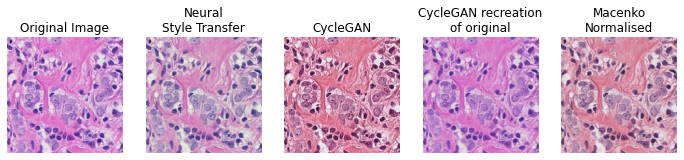

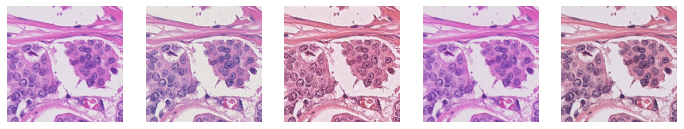

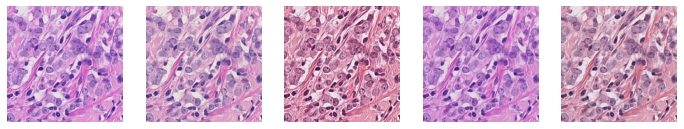

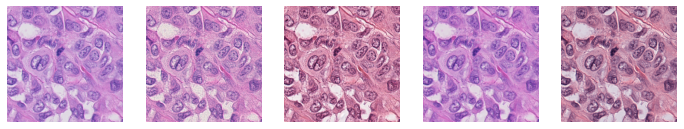

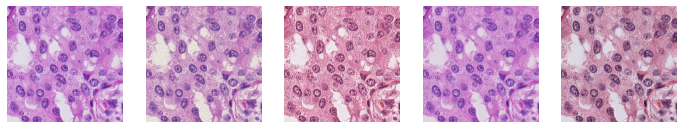

...

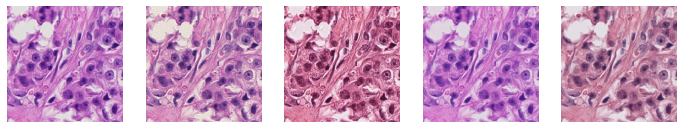

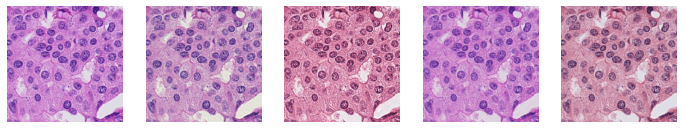

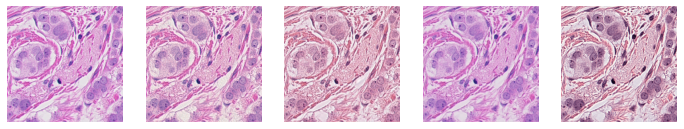

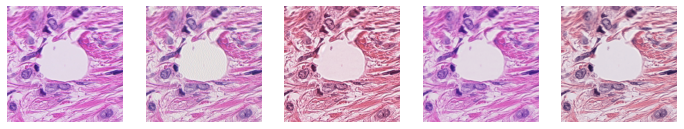

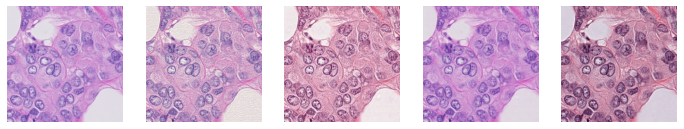

In [7]:
## Model 2

train_scanners = ["Hamamatsu XR"]
valid_scanners= ["Aperio CS"]  
train_names=("").join([name[-2:] for name in train_scanners])
valid_names=("").join([name[-2:] for name in valid_scanners])
domainA_ids,domainB_ids,_ = preprocess_crops(20,20,10,train_scanners=train_scanners,valid_scanners=valid_scanners)  


cgan_path="/drive/MyDrive/MIDOG_Style_Transfer/pytorch-CycleGAN-and-pix2pix/results/midog_cyclegan_"+train_names+valid_names+"_big/test_8/"

for i in tqdm(range(20)):
  content_path="/drive/MyDrive/MIDOG_Challenge_JJB/image_crops/"+domainA_ids[i][:3]+"/"+domainA_ids[i]
  style_path="/drive/MyDrive/MIDOG_Challenge_JJB/image_crops/"+domainB_ids[i][:3]+"/"+domainB_ids[i]
  cgan_file=domainA_ids[i][:3]+"/"+domainA_ids[i][:-5]+"_fake_B.png"
  cgan_file_recreation=domainA_ids[i][:3]+"/"+domainA_ids[i][:-5]+"_rec_A.png"

  image=PIL.Image.open(open(str(content_path), 'rb'))
  Inorm,H,E = normalizeStaining(np.array(image))

  nst_img=style_transfer(content_path,style_path,vgg,device,max_size=512,print_out=False,show_images=False,epochs=101,show_every=100,beta=1e5)[-1]
  cgan_img=plt.imread(cgan_path+cgan_file)
  cgan_img_rec=plt.imread(cgan_path+cgan_file_recreation)

  if i==0:
    plt.figure(figsize=(12, 8))
    plt.subplot(1,5,1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis('off')
    plt.subplot(1,5,2)
    plt.imshow(nst_img)
    plt.title("Neural\nStyle Transfer")
    plt.axis('off')
    plt.subplot(1,5,3)
    plt.imshow(cgan_img)
    plt.title("CycleGAN")
    plt.axis('off')
    plt.subplot(1,5,4)
    plt.imshow(cgan_img_rec)
    plt.title("CycleGAN recreation\nof original")
    plt.axis('off')
    plt.subplot(1,5,5)
    plt.imshow(Inorm)
    plt.title("Macenko\nNormalised")
    plt.axis('off')

  else:
    plt.figure(figsize=(12, 8))
    plt.subplot(1,5,1)
    plt.imshow(image)
    plt.axis('off')
    plt.subplot(1,5,2)
    plt.imshow(nst_img)
    plt.axis('off')
    plt.subplot(1,5,3)
    plt.imshow(cgan_img)
    plt.axis('off')
    plt.subplot(1,5,4)
    plt.imshow(cgan_img_rec)
    plt.axis('off')
    plt.subplot(1,5,5)
    plt.imshow(Inorm)
    plt.axis('off')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  del sys.path[0]


  0%|          | 0/20 [00:00<?, ?it/s]

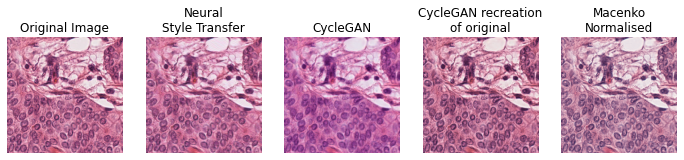

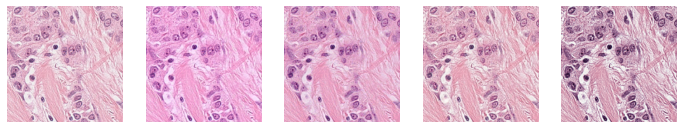

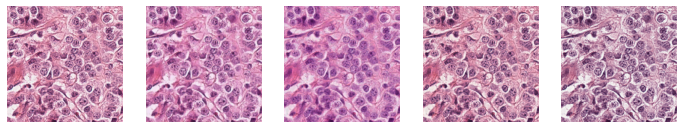

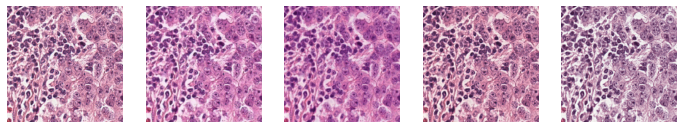

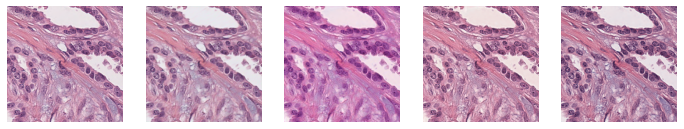

...

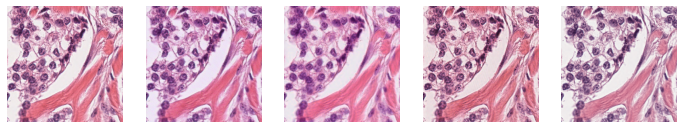

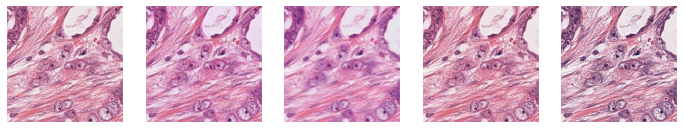

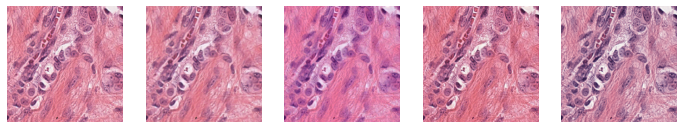

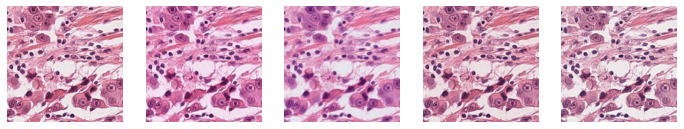

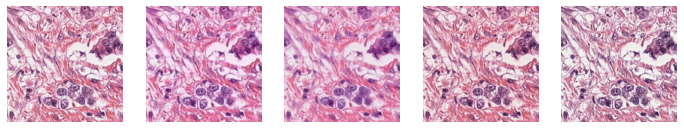

In [16]:
## Model 3

train_scanners = ["Aperio CS"] 
valid_scanners=["Hamamatsu S360"]

train_names=("").join([name[-2:] for name in train_scanners])
valid_names=("").join([name[-2:] for name in valid_scanners])
domainA_ids,domainB_ids,_ = preprocess_crops(20,20,10,train_scanners=train_scanners,valid_scanners=valid_scanners)  


cgan_path="/drive/MyDrive/MIDOG_Style_Transfer/pytorch-CycleGAN-and-pix2pix/results/midog_cyclegan_"+train_names+valid_names+"_big/test_5/"

for i in tqdm(range(20)):
  content_path="/drive/MyDrive/MIDOG_Challenge_JJB/image_crops/"+domainA_ids[i][:3]+"/"+domainA_ids[i]
  style_path="/drive/MyDrive/MIDOG_Challenge_JJB/image_crops/"+domainB_ids[i][:3]+"/"+domainB_ids[i]
  cgan_file=domainA_ids[i][:3]+"/"+domainA_ids[i][:-5]+"_fake_B.png"
  cgan_file_recreation=domainA_ids[i][:3]+"/"+domainA_ids[i][:-5]+"_rec_A.png"

  image=PIL.Image.open(open(str(content_path), 'rb'))
  Inorm,H,E = normalizeStaining(np.array(image))

  nst_img=style_transfer(content_path,style_path,vgg,device,max_size=512,print_out=False,show_images=False,epochs=101,show_every=100,beta=1e5)[-1]
  cgan_img=plt.imread(cgan_path+cgan_file)
  cgan_img_rec=plt.imread(cgan_path+cgan_file_recreation)

  if i==0:
    plt.figure(figsize=(12, 8))
    plt.subplot(1,5,1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis('off')
    plt.subplot(1,5,2)
    plt.imshow(nst_img)
    plt.title("Neural\nStyle Transfer")
    plt.axis('off')
    plt.subplot(1,5,3)
    plt.imshow(cgan_img)
    plt.title("CycleGAN")
    plt.axis('off')
    plt.subplot(1,5,4)
    plt.imshow(cgan_img_rec)
    plt.title("CycleGAN recreation\nof original")
    plt.axis('off')
    plt.subplot(1,5,5)
    plt.imshow(Inorm)
    plt.title("Macenko\nNormalised")
    plt.axis('off')

  else:
    plt.figure(figsize=(12, 8))
    plt.subplot(1,5,1)
    plt.imshow(image)
    plt.axis('off')
    plt.subplot(1,5,2)
    plt.imshow(nst_img)
    plt.axis('off')
    plt.subplot(1,5,3)
    plt.imshow(cgan_img)
    plt.axis('off')
    plt.subplot(1,5,4)
    plt.imshow(cgan_img_rec)
    plt.axis('off')
    plt.subplot(1,5,5)
    plt.imshow(Inorm)
    plt.axis('off')

## Create images for use in GitHub

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|          | 0/3 [00:00<?, ?it/s]

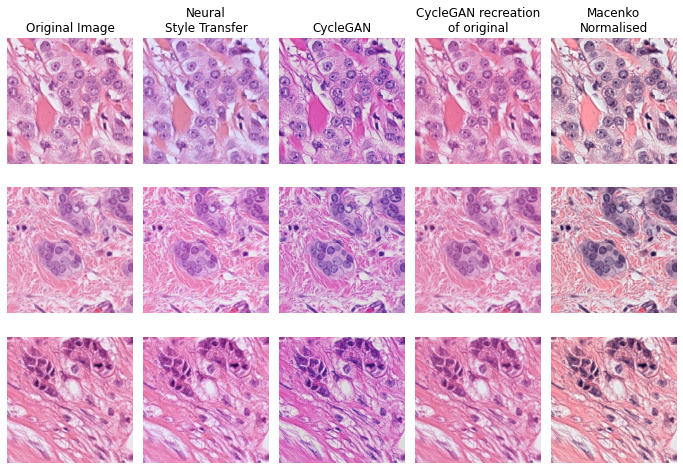

In [23]:
## Model 1

train_scanners = ["Hamamatsu S360"]
valid_scanners=["Hamamatsu XR"] 
train_names=("").join([name[-2:] for name in train_scanners])
valid_names=("").join([name[-2:] for name in valid_scanners])
domainA_ids,domainB_ids,_ = preprocess_crops(20,20,10,train_scanners=train_scanners,valid_scanners=valid_scanners)  


cgan_path="/drive/MyDrive/MIDOG_Style_Transfer/pytorch-CycleGAN-and-pix2pix/results/midog_cyclegan_"+train_names+valid_names+"_big/test_8/"

examples=3

for i in tqdm(range(examples)):
  content_path="/drive/MyDrive/MIDOG_Challenge_JJB/image_crops/"+domainA_ids[i][:3]+"/"+domainA_ids[i]
  style_path="/drive/MyDrive/MIDOG_Challenge_JJB/image_crops/"+domainB_ids[i][:3]+"/"+domainB_ids[i]
  cgan_file=domainA_ids[i][:3]+"/"+domainA_ids[i][:-5]+"_fake_B.png"
  cgan_file_recreation=domainA_ids[i][:3]+"/"+domainA_ids[i][:-5]+"_rec_A.png"

  image=PIL.Image.open(open(str(content_path), 'rb'))
  Inorm,H,E = normalizeStaining(np.array(image))

  nst_img=style_transfer(content_path,style_path,vgg,device,max_size=512,print_out=False,show_images=False,epochs=101,show_every=100,beta=1e5)[-1]
  cgan_img=plt.imread(cgan_path+cgan_file)
  cgan_img_rec=plt.imread(cgan_path+cgan_file_recreation)

  if i==0:
    plt.figure(figsize=(12, 8))
    plt.subplot(examples,5,1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis('off')
    plt.subplot(examples,5,2)
    plt.imshow(nst_img)
    plt.title("Neural\nStyle Transfer")
    plt.axis('off')
    plt.subplot(examples,5,3)
    plt.imshow(cgan_img)
    plt.title("CycleGAN")
    plt.axis('off')
    plt.subplot(examples,5,4)
    plt.imshow(cgan_img_rec)
    plt.title("CycleGAN recreation\nof original")
    plt.axis('off')
    plt.subplot(examples,5,5)
    plt.imshow(Inorm)
    plt.title("Macenko\nNormalised")
    plt.axis('off')

  else:
    plt.subplot(examples,5,1+(5*i))
    plt.imshow(image)
    plt.axis('off')
    plt.subplot(examples,5,2+(5*i))
    plt.imshow(nst_img)
    plt.axis('off')
    plt.subplot(examples,5,3+(5*i))
    plt.imshow(cgan_img)
    plt.axis('off')
    plt.subplot(examples,5,4+(5*i))
    plt.imshow(cgan_img_rec)
    plt.axis('off')
    plt.subplot(examples,5,5+(5*i))
    plt.imshow(Inorm)
    plt.axis('off')

plt.subplots_adjust(wspace=0.08, hspace=0.1)
plt.savefig('Styles_Mod1.png',bbox_inches='tight')


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|          | 0/3 [00:00<?, ?it/s]

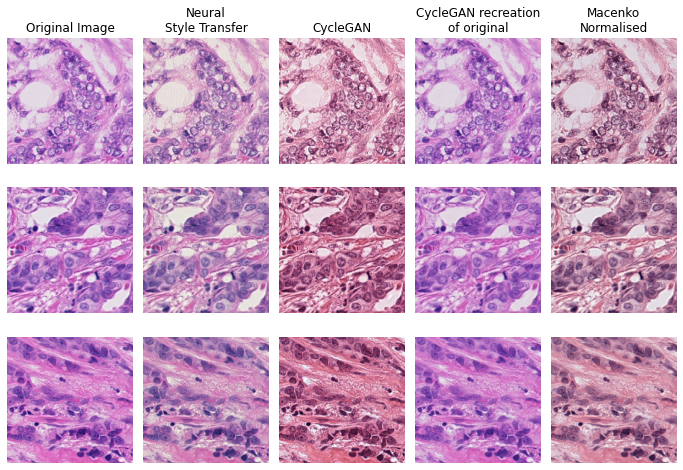

In [21]:
## Model 2

train_scanners = ["Hamamatsu XR"]
valid_scanners= ["Aperio CS"]  
train_names=("").join([name[-2:] for name in train_scanners])
valid_names=("").join([name[-2:] for name in valid_scanners])
domainA_ids,domainB_ids,_ = preprocess_crops(20,20,10,train_scanners=train_scanners,valid_scanners=valid_scanners)  


cgan_path="/drive/MyDrive/MIDOG_Style_Transfer/pytorch-CycleGAN-and-pix2pix/results/midog_cyclegan_"+train_names+valid_names+"_big/test_8/"

examples=3

for i in tqdm(range(examples)):
  content_path="/drive/MyDrive/MIDOG_Challenge_JJB/image_crops/"+domainA_ids[i][:3]+"/"+domainA_ids[i]
  style_path="/drive/MyDrive/MIDOG_Challenge_JJB/image_crops/"+domainB_ids[i][:3]+"/"+domainB_ids[i]
  cgan_file=domainA_ids[i][:3]+"/"+domainA_ids[i][:-5]+"_fake_B.png"
  cgan_file_recreation=domainA_ids[i][:3]+"/"+domainA_ids[i][:-5]+"_rec_A.png"

  image=PIL.Image.open(open(str(content_path), 'rb'))
  Inorm,H,E = normalizeStaining(np.array(image))

  nst_img=style_transfer(content_path,style_path,vgg,device,max_size=512,print_out=False,show_images=False,epochs=101,show_every=100,beta=1e5)[-1]
  cgan_img=plt.imread(cgan_path+cgan_file)
  cgan_img_rec=plt.imread(cgan_path+cgan_file_recreation)

  if i==0:
    plt.figure(figsize=(12, 8))
    plt.subplot(examples,5,1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis('off')
    plt.subplot(examples,5,2)
    plt.imshow(nst_img)
    plt.title("Neural\nStyle Transfer")
    plt.axis('off')
    plt.subplot(examples,5,3)
    plt.imshow(cgan_img)
    plt.title("CycleGAN")
    plt.axis('off')
    plt.subplot(examples,5,4)
    plt.imshow(cgan_img_rec)
    plt.title("CycleGAN recreation\nof original")
    plt.axis('off')
    plt.subplot(examples,5,5)
    plt.imshow(Inorm)
    plt.title("Macenko\nNormalised")
    plt.axis('off')

  else:
    plt.subplot(examples,5,1+(5*i))
    plt.imshow(image)
    plt.axis('off')
    plt.subplot(examples,5,2+(5*i))
    plt.imshow(nst_img)
    plt.axis('off')
    plt.subplot(examples,5,3+(5*i))
    plt.imshow(cgan_img)
    plt.axis('off')
    plt.subplot(examples,5,4+(5*i))
    plt.imshow(cgan_img_rec)
    plt.axis('off')
    plt.subplot(examples,5,5+(5*i))
    plt.imshow(Inorm)
    plt.axis('off')

plt.subplots_adjust(wspace=0.08, hspace=0.1)
plt.savefig('Styles_Mod2.png',bbox_inches='tight')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  from ipykernel import kernelapp as app


  0%|          | 0/3 [00:00<?, ?it/s]

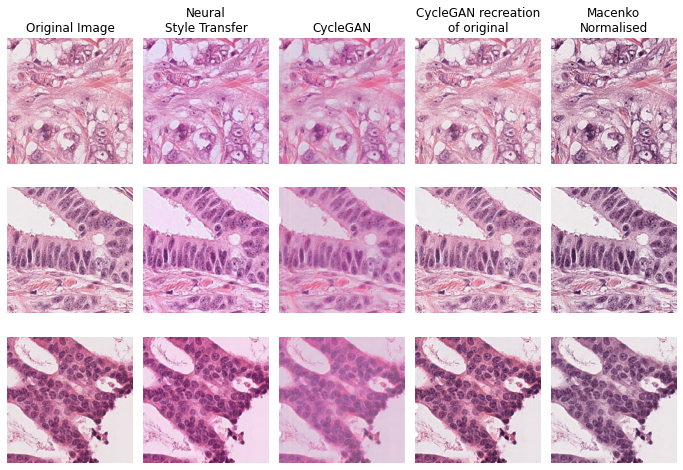

In [22]:
## Model 3

train_scanners = ["Aperio CS"] 
valid_scanners=["Hamamatsu S360"]

train_names=("").join([name[-2:] for name in train_scanners])
valid_names=("").join([name[-2:] for name in valid_scanners])
domainA_ids,domainB_ids,_ = preprocess_crops(20,20,10,train_scanners=train_scanners,valid_scanners=valid_scanners)  


cgan_path="/drive/MyDrive/MIDOG_Style_Transfer/pytorch-CycleGAN-and-pix2pix/results/midog_cyclegan_"+train_names+valid_names+"_big/test_8/"

examples=3

for i in tqdm(range(examples)):
  content_path="/drive/MyDrive/MIDOG_Challenge_JJB/image_crops/"+domainA_ids[i][:3]+"/"+domainA_ids[i]
  style_path="/drive/MyDrive/MIDOG_Challenge_JJB/image_crops/"+domainB_ids[i][:3]+"/"+domainB_ids[i]
  cgan_file=domainA_ids[i][:3]+"/"+domainA_ids[i][:-5]+"_fake_B.png"
  cgan_file_recreation=domainA_ids[i][:3]+"/"+domainA_ids[i][:-5]+"_rec_A.png"

  image=PIL.Image.open(open(str(content_path), 'rb'))
  Inorm,H,E = normalizeStaining(np.array(image))

  nst_img=style_transfer(content_path,style_path,vgg,device,max_size=512,print_out=False,show_images=False,epochs=101,show_every=100,beta=1e5)[-1]
  cgan_img=plt.imread(cgan_path+cgan_file)
  cgan_img_rec=plt.imread(cgan_path+cgan_file_recreation)

  if i==0:
    plt.figure(figsize=(12, 8))
    plt.subplot(examples,5,1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis('off')
    plt.subplot(examples,5,2)
    plt.imshow(nst_img)
    plt.title("Neural\nStyle Transfer")
    plt.axis('off')
    plt.subplot(examples,5,3)
    plt.imshow(cgan_img)
    plt.title("CycleGAN")
    plt.axis('off')
    plt.subplot(examples,5,4)
    plt.imshow(cgan_img_rec)
    plt.title("CycleGAN recreation\nof original")
    plt.axis('off')
    plt.subplot(examples,5,5)
    plt.imshow(Inorm)
    plt.title("Macenko\nNormalised")
    plt.axis('off')

  else:
    plt.subplot(examples,5,1+(5*i))
    plt.imshow(image)
    plt.axis('off')
    plt.subplot(examples,5,2+(5*i))
    plt.imshow(nst_img)
    plt.axis('off')
    plt.subplot(examples,5,3+(5*i))
    plt.imshow(cgan_img)
    plt.axis('off')
    plt.subplot(examples,5,4+(5*i))
    plt.imshow(cgan_img_rec)
    plt.axis('off')
    plt.subplot(examples,5,5+(5*i))
    plt.imshow(Inorm)
    plt.axis('off')

plt.subplots_adjust(wspace=0.08, hspace=0.1)
plt.savefig('Styles_Mod3.png',bbox_inches='tight')
